#GR5242 Final Project: Neural Style Transfer
###Group members: 

###Rachel Wu (jw3663)

###Haiqing Xu (hx2259)

###Siwei Liu (sl4224)

###Qingyu Zhang (qz2351)

#Import Libraries

In [0]:
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib.pyplot import imshow
mpl.rcParams['figure.figsize'] = (15,15)
mpl.rcParams['axes.grid'] = False
import numpy as np
from PIL import Image
import time

In [0]:
try:
  %tensorflow_version 2.x
except Exception:
  pass
import tensorflow as tf

TensorFlow 2.x selected.


In [0]:
#authorization from google drive
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


#Download VGG19

In [0]:
#print all layers of VGG 19
vgg = tf.keras.applications.VGG19(include_top=False, weights='imagenet')
for layer in vgg.layers:
  print(layer.name)

80142336/80134624 [==============================] - 7s 0us/step
input_1
block1_conv1
block1_conv2
block1_pool
block2_conv1
block2_conv2
block2_pool
block3_conv1
block3_conv2
block3_conv3
block3_conv4
block3_pool
block4_conv1
block4_conv2
block4_conv3
block4_conv4
block4_pool
block5_conv1
block5_conv2
block5_conv3
block5_conv4
block5_pool


#Decide Layers to Use from VGG19
According to the paper

content layer: higher layers in the network capture the high-level content in terms of object and their arrangement in the input image

style layer: require multiple layers and include the feature correlations


In [0]:
content_layers = ["block5_conv2"]
style_layers = ["block1_conv1","block2_conv1","block3_conv1","block4_conv1","block5_conv1"]

#Define Content Loss and Style Loss

In [0]:
style_weight = 1e3
content_weight = 1e1
num_content_layers = 1
num_style_layers = 5

In [0]:
def content_loss(content_output, content_target):
  content_loss = 0.5*tf.add_n([tf.reduce_mean((content_output-content_target)**2)]) 
  return content_loss

In [0]:
def gram_matrix(style_output):
  result = tf.linalg.einsum('aijk,aijl->akl', style_output, style_output)
  return result

In [0]:
def style_loss(style_outputs, style_targets):
  style_loss = tf.add_n([tf.reduce_mean((style_outputs[i]-style_targets[i])**2/(4*(style_outputs[i].shape[1]**2)*(style_targets[i].shape[1]**2)))
                  for i in range(num_style_layers)]) 
  return style_loss

In [0]:
def total_loss(c_loss, s_loss):
  return c_loss * content_weight / num_content_layers + s_loss * style_weight / num_style_layers

#Generate Content and Style Representations

In [0]:
def get_vgg_layers(layers):
  #freezing weights in vgg19 layers
  vgg.trainable = False

  output_layers = []
  for layer in layers:
    output_layers.append(vgg.get_layer(layer).output)
  
  return tf.keras.Model([vgg.input], output_layers)

In [0]:
def content_representation(image, layers = content_layers):
  output = get_vgg_layers(layers)
  return output(image)[0]

In [0]:
def style_representation(image, layers = style_layers):
  output = get_vgg_layers(layers)
  output = output(image)
  output = [gram_matrix(i) for i in output]
  return output

In [0]:
def get_representation(image):
  image_processed = tf.keras.applications.vgg19.preprocess_input(image*255.0)
  content_output = content_representation(image)
  style_output = style_representation(image)
  return [content_output, style_output]

#Gradient Descent

In [0]:
#pixel between 0 and 1
def clip(image):
  return tf.clip_by_value(image, clip_value_min = 0.0, clip_value_max = 1.0)
opt = tf.optimizers.Adam(learning_rate=0.02, beta_1=0.99, epsilon=1e-1)

In [0]:
def gradient_descent(image):
  with tf.GradientTape() as tape:
    output = get_representation(image)
    c_loss = content_loss(output[0], content_target)
    s_loss = style_loss(output[1], style_target)
    loss = total_loss(c_loss, s_loss)

  grad = tape.gradient(loss, image)
  opt.apply_gradients([(grad, image)])
  image.assign(clip(image))
  
  return [c_loss, s_loss, loss]

#Run Model

In [0]:
#load and resize images
LENGTH = 480
WIDTH = 640
def load_and_resize_image(path_to_file):
  image = plt.imread(path_to_file)
  image = tf.image.convert_image_dtype(image, tf.float32)
  image = tf.expand_dims(image,0)
  image = tf.compat.v1.image.resize_bilinear(image, [LENGTH, WIDTH])
  return image

In [0]:
!ls "/content/drive/My Drive/5242FinalProject"

5242_Code_V1		       littlevillage.jpg    shanghai.jpg
5242_Code_V2		       loss		    style_cubist.jpg
5242FinalProject_Writing.gdoc  Maggie_5242_Code_V2  style_feathers.jpg
content_newyork.jpg	       nst_utils.py	    style_mosaic.jpg
content_shanghai.jpg	       __pycache__	    SWL_AML_finalProject.ipynb
house.jpg		       RW1213		    Untitled0.ipynb
imagenet-vgg-verydeep-19.mat   RW-5242_Code_V2	    village.jpg
Images			       RW-5242_Code_V3	    wind.jpg


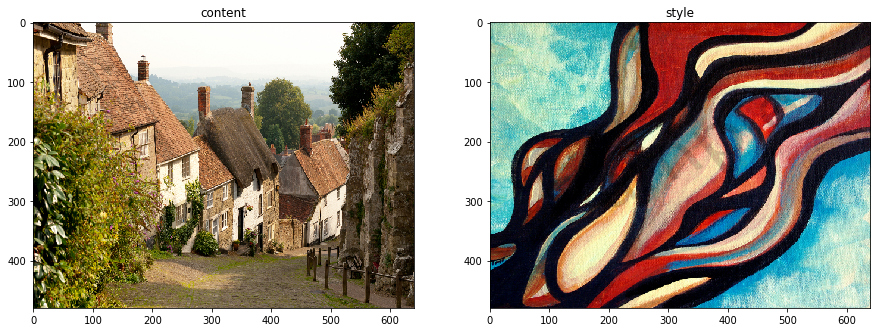

In [0]:
#display content and style images
content_path = "/content/drive/My Drive/5242FinalProject/village.jpg"
style_path = "/content/drive/My Drive/5242FinalProject/wind.jpg"
content_image = load_and_resize_image(content_path)
style_image = load_and_resize_image(style_path)

plt.subplot(1, 2, 1)
imshow(tf.squeeze(content_image, axis=0))
plt.title('content')
plt.subplot(1, 2, 2)
imshow(tf.squeeze(style_image, axis=0))
plt.title('style')
plt.show()

In [0]:
#content and style representation of targets
content_target = get_representation(content_image)[0]
style_target = get_representation(style_image)[1]

#Effect of different training iterations

.................................................Step 50


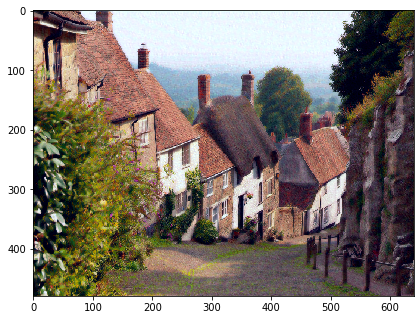

..................................................Step 100


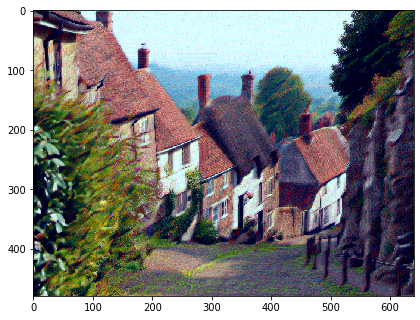

....................................................................................................Step 200


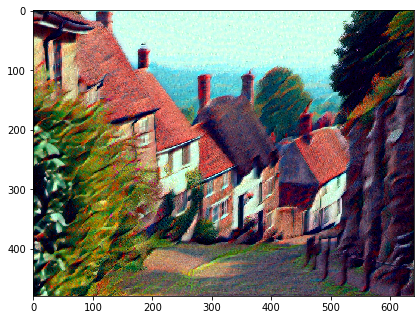

....................................................................................................Step 300


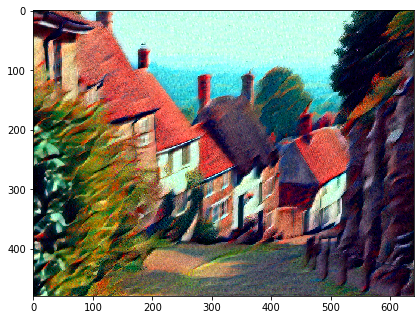

....................................................................................................Step 400


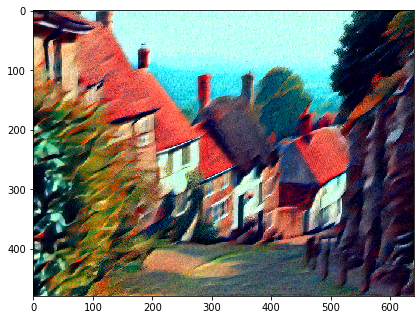

....................................................................................................Step 500


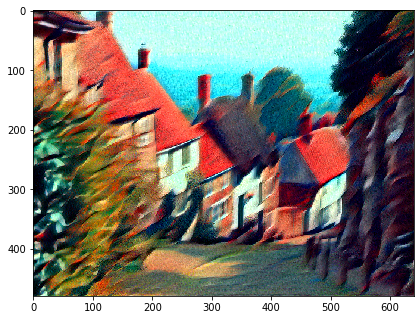

....................................................................................................Step 600


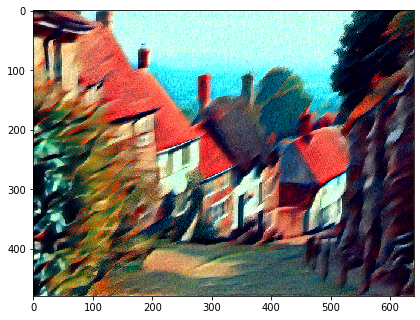

....................................................................................................Step 700


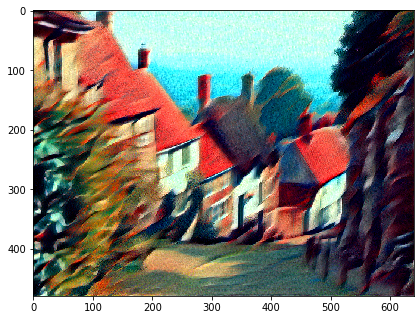

....................................................................................................Step 800


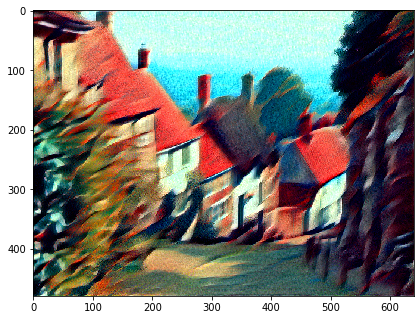

....................................................................................................Step 900


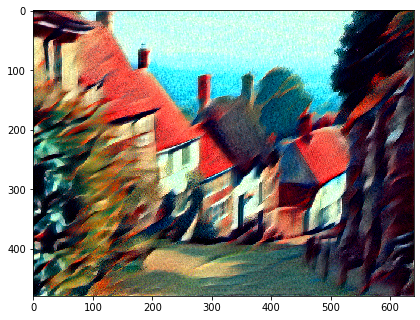

....................................................................................................Step 1000


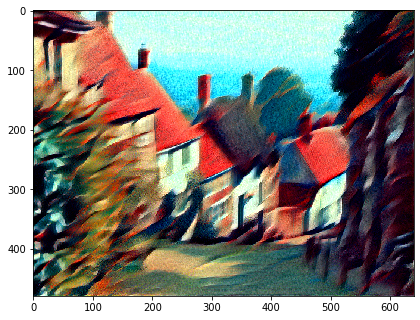

.Total time: 209.5


In [0]:
tf.random.set_seed(0)
import time
start = time.time()
loss_ls = [[], [], []]

total_steps = 1000
#initialize with content image
image = tf.Variable(content_image)

for i in range(1, total_steps+1):
  if i == 50 or i % 100 == 0:
    print("Step " + str(i))
    plt.subplot(1, 2, 1)
    imshow(tf.squeeze(image, axis=0))
    plt.show()
  print(".", end='')
  loss_result = gradient_descent(image)
  for i in range(3):
    loss_ls[i].append(loss_result[i].numpy())

end = time.time()
print("Total time: {:.1f}".format(end-start))

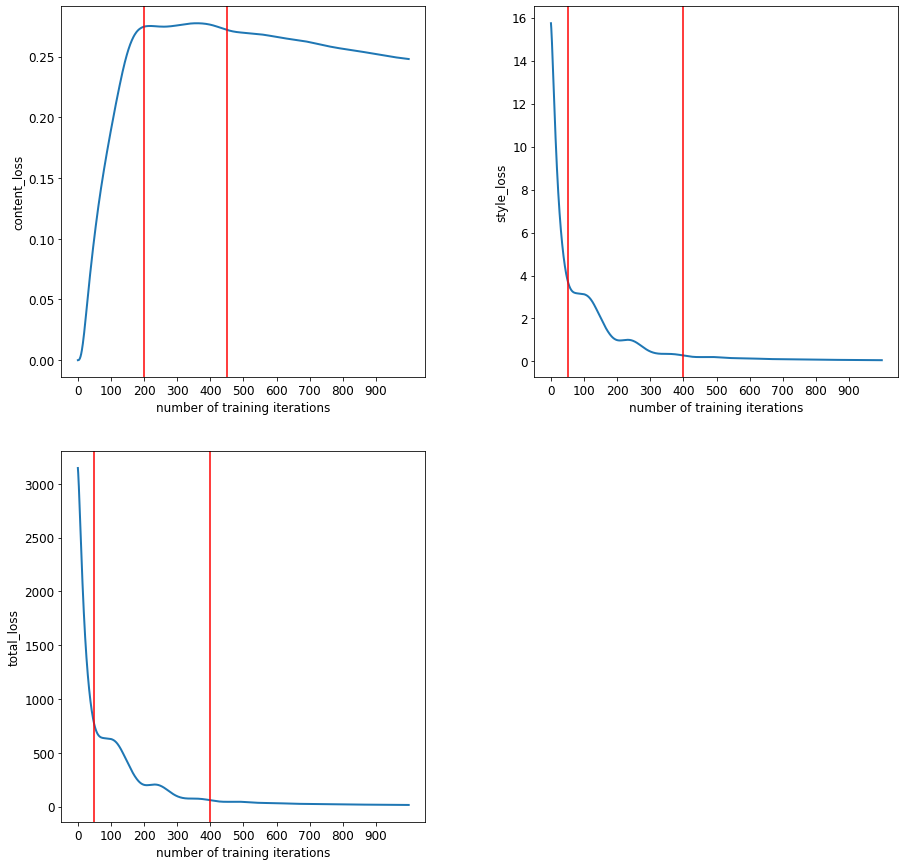

In [0]:
mpl.rcParams.update({'font.size': 12})
x = np.arange(1000)
plt.subplots_adjust(wspace = 0.3)
plt.subplot(2,2,1)
plt.plot(x, loss_ls[0], linewidth=2)
plt.xlabel('number of training iterations')
plt.ylabel('content_loss')
plt.xticks(np.arange(0, 1000, 100))
plt.axvline(x=200, color = 'r')
plt.axvline(x=450, color= 'r')
plt.subplot(2,2,2)
plt.plot(x, loss_ls[1], linewidth=2)
plt.xlabel('number of training iterations')
plt.ylabel('style_loss')
plt.xticks(np.arange(0, 1000, 100))
plt.axvline(x=50, color = 'r')
plt.axvline(x=400, color= 'r')
plt.subplot(2,2,3)
plt.plot(x, loss_ls[2], linewidth=2)
plt.xlabel('number of training iterations')
plt.ylabel('total_loss')
plt.xticks(np.arange(0, 1000, 100))
plt.axvline(x=50, color = 'r')
plt.axvline(x=400, color= 'r')
plt.show()

#Effect of different random seeds

seed 0
.......................................................................................................................................................................................................Step 200


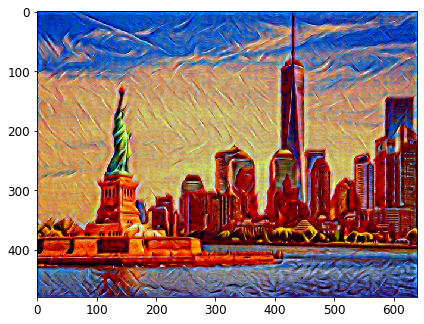

........................................................................................................................................................................................................Step 400


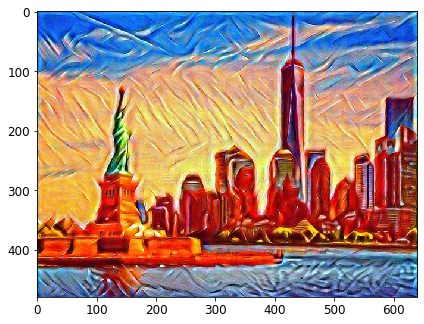

........................................................................................................................................................................................................Step 600


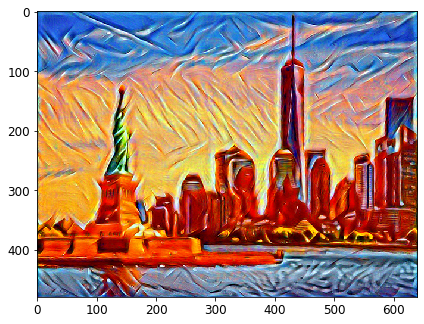

........................................................................................................................................................................................................Step 800


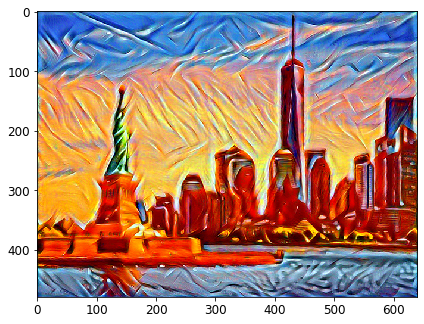

........................................................................................................................................................................................................Step 1000


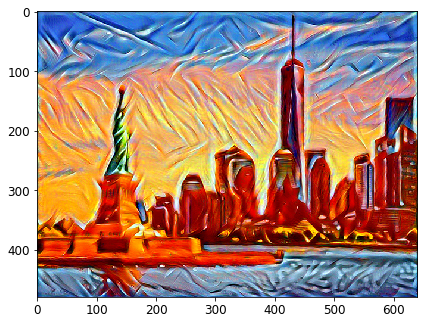

.Total time: 194.0
seed 23
.......................................................................................................................................................................................................Step 200


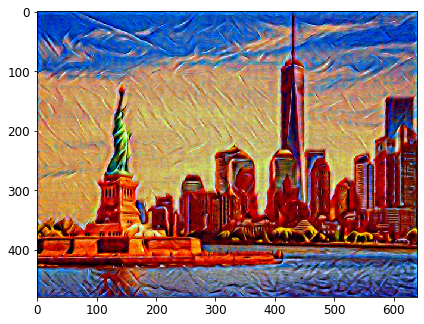

........................................................................................................................................................................................................Step 400


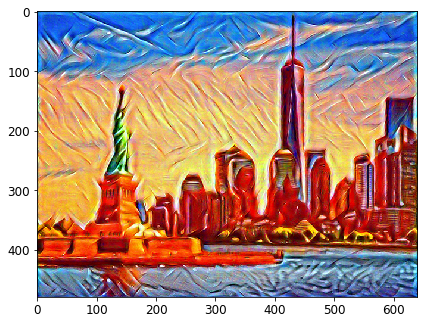

........................................................................................................................................................................................................Step 600


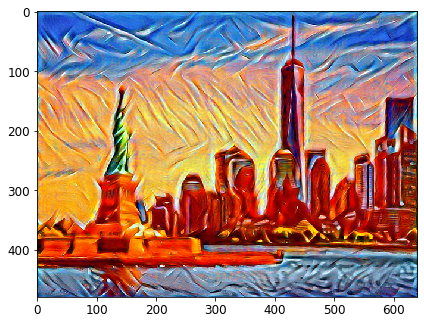

........................................................................................................................................................................................................Step 800


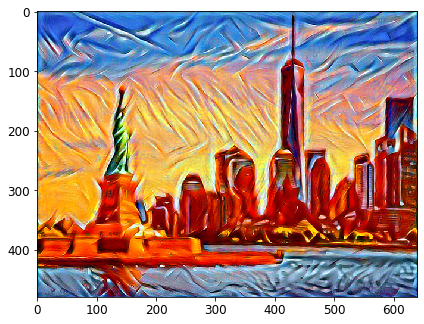

........................................................................................................................................................................................................Step 1000


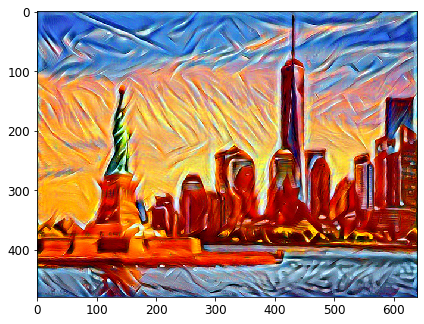

.Total time: 193.7
seed 625
.......................................................................................................................................................................................................Step 200


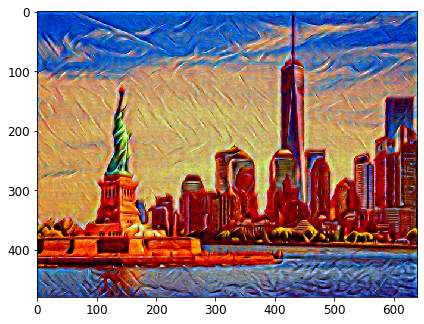

........................................................................................................................................................................................................Step 400


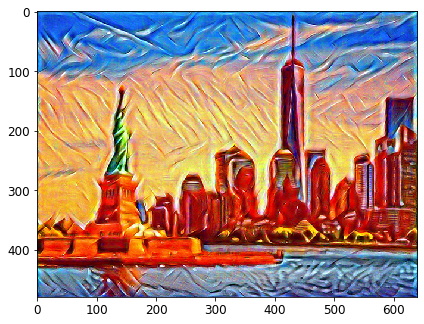

........................................................................................................................................................................................................Step 600


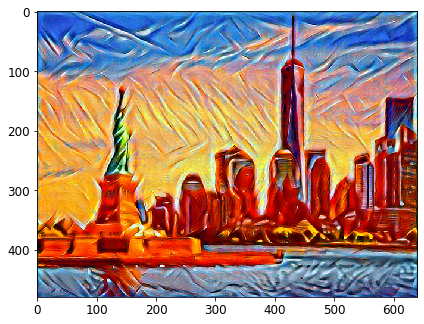

........................................................................................................................................................................................................Step 800


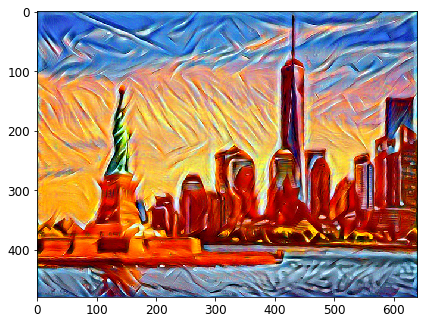

........................................................................................................................................................................................................Step 1000


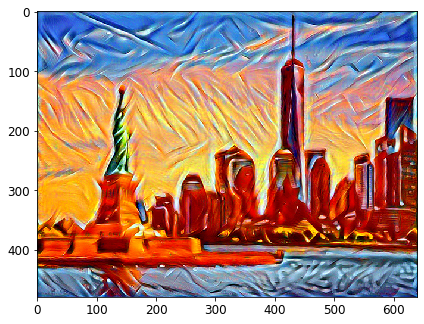

.Total time: 193.6
seed 2019
.......................................................................................................................................................................................................Step 200


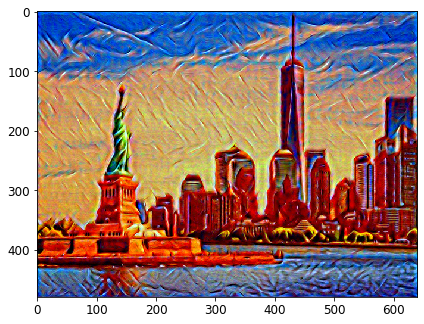

........................................................................................................................................................................................................Step 400


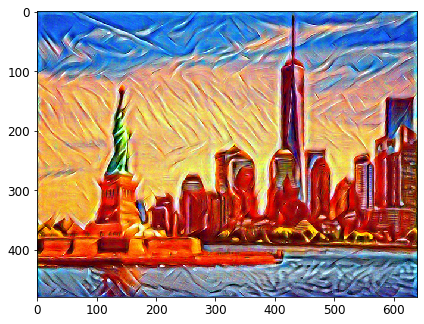

........................................................................................................................................................................................................Step 600


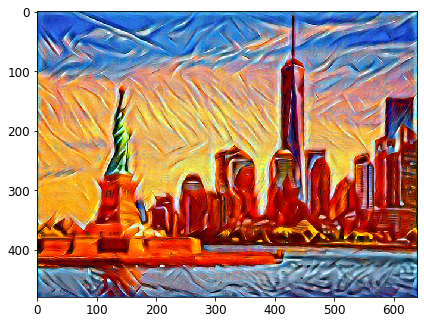

........................................................................................................................................................................................................Step 800


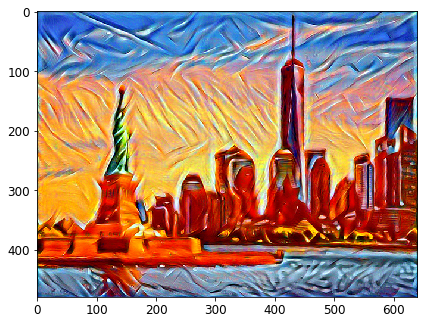

........................................................................................................................................................................................................Step 1000


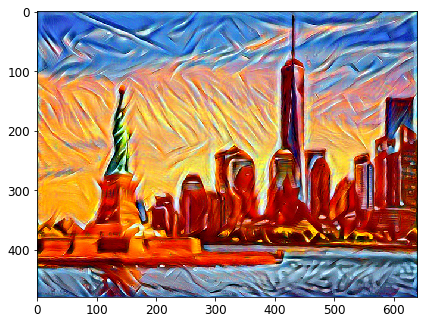

.Total time: 194.3


In [0]:
seeds = [0,23,625,2019]
loss_seeds = []
for seed in seeds:
  print("seed " + str(seed))
  tf.random.set_seed(seed)
  import time
  start = time.time()
  loss_ls = [[], [], []]

  total_steps = 1000
  #initialize with content image
  image = tf.Variable(content_image)

  for i in range(1, total_steps+1):
    if i % 200 == 0:
      print("Step " + str(i))
      plt.subplot(1, 2, 1)
      imshow(tf.squeeze(image, axis=0))
      plt.show()
    print(".", end='')
    loss_result = gradient_descent(image)
    for i in range(3):
      loss_ls[i].append(loss_result[i].numpy())

  end = time.time()
  print("Total time: {:.1f}".format(end-start))
  loss_seeds.append(loss_ls)

<function matplotlib.pyplot.show>

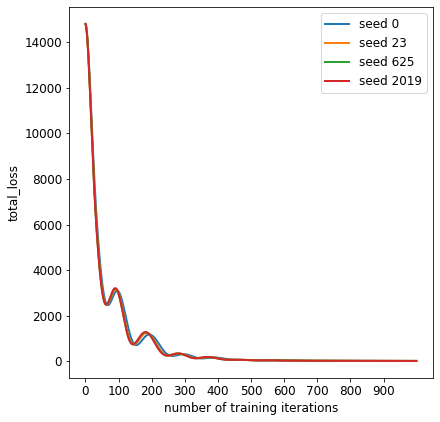

In [0]:
#plot loss functions
mpl.rcParams.update({'font.size': 12})
x = np.arange(1000)
plt.subplots_adjust(wspace = 0.3)
plt.subplot(2,2,1)
plt.plot(x, loss_seeds[0][2], linewidth=2, label = 'seed 0')
plt.plot(x, loss_seeds[1][2], linewidth=2, label = 'seed 23')
plt.plot(x, loss_seeds[2][2], linewidth=2, label = 'seed 625')
plt.plot(x, loss_seeds[3][2], linewidth=2, label = 'seed 2019')
plt.legend(loc="upper right")
plt.xlabel('number of training iterations')
plt.ylabel('total_loss')
plt.xticks(np.arange(0, 1000, 100))
plt.show

#Effect of different relative weight of content & loss in the loss function

Can be completed by changing values of the variables style_weight and content_weight

#Neural style transfer with two style images

In [0]:
#define a new total loss function that takes one content loss and two style losses
def total_loss_two_styles(c_loss, s1_loss, s2_loss):
  return c_loss * content_weight / num_content_layers + s1_loss/2 * style_weight / num_style_layers + s2_loss/2 * style_weight / num_style_layers

In [0]:
#define a new gradient descent method
def gradient_descent_two_styles(image):
  with tf.GradientTape() as tape:
    output = get_representation(image)
    c_loss = content_loss(output[0], content_target)
    s1_loss = style_loss(output[1], style1_target)
    s2_loss = style_loss(output[1], style2_target)
    loss = total_loss_two_styles(c_loss, s1_loss, s2_loss)

  grad = tape.gradient(loss, image)
  opt.apply_gradients([(grad, image)])
  image.assign(clip(image))
  
  return [c_loss, s1_loss, s2_loss, loss]

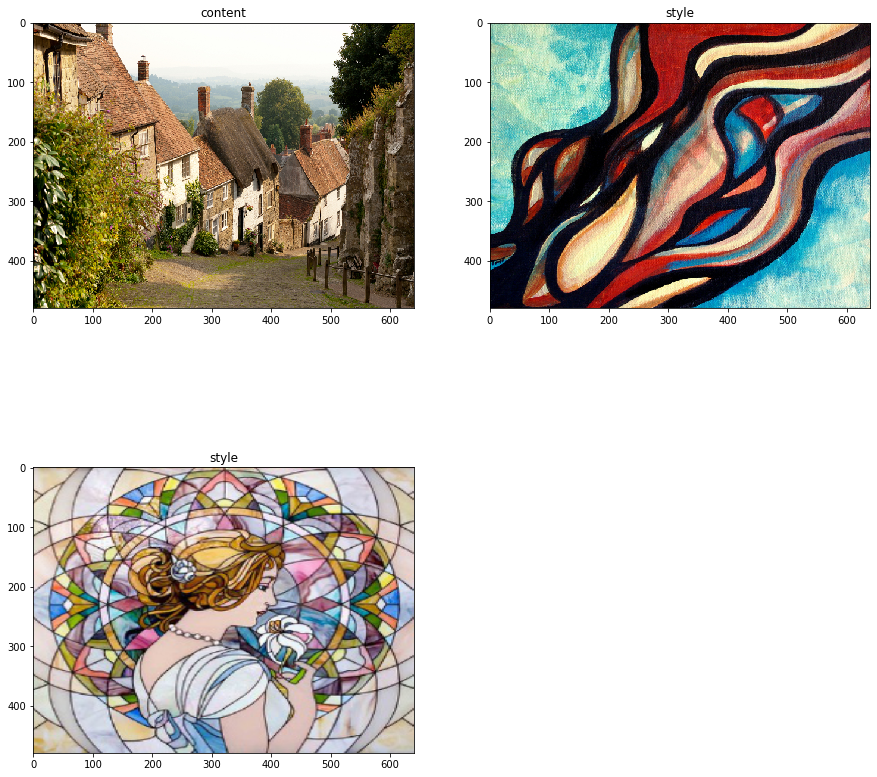

In [0]:
content_path = "/content/drive/My Drive/5242FinalProject/village.jpg"
style1_path = "/content/drive/My Drive/5242FinalProject/wind.jpg"
style2_path = "/content/drive/My Drive/5242FinalProject/style_mosaic.jpg"
content_image = load_and_resize_image(content_path)
style1_image = load_and_resize_image(style1_path)
style2_image = load_and_resize_image(style2_path)

plt.subplot(2, 2, 1)
imshow(tf.squeeze(content_image, axis=0))
plt.title('content')
plt.subplot(2, 2, 2)
imshow(tf.squeeze(style1_image, axis=0))
plt.title('style')
plt.subplot(2, 2, 3)
imshow(tf.squeeze(style2_image, axis=0))
plt.title('style')
plt.show()

In [0]:
#content and style representation of targets
content_target = get_representation(content_image)[0]
style1_target = get_representation(style1_image)[1]
style2_target = get_representation(style2_image)[1]

.................................................Step 50


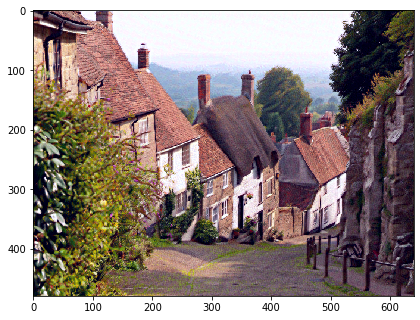

..................................................Step 100


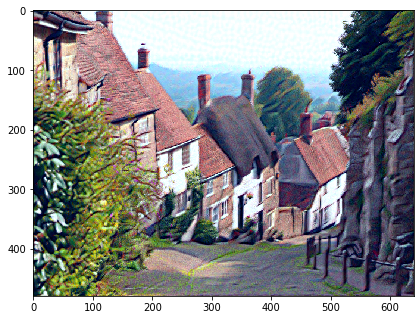

....................................................................................................Step 200


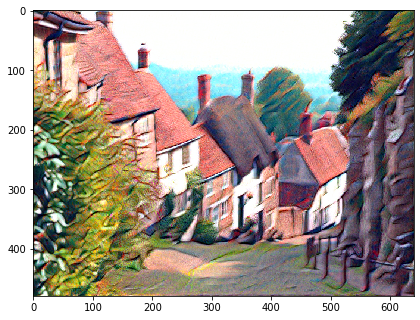

....................................................................................................Step 300


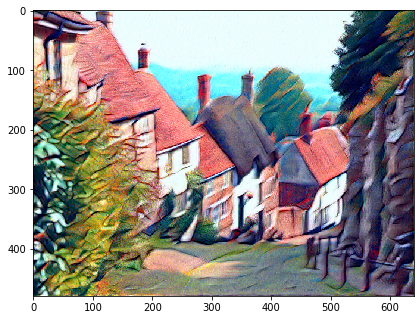

....................................................................................................Step 400


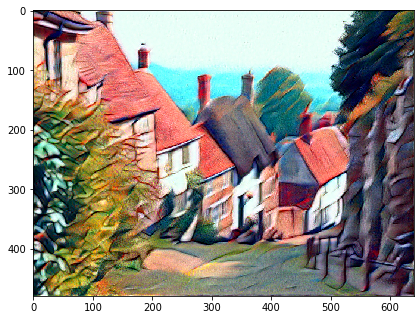

....................................................................................................Step 500


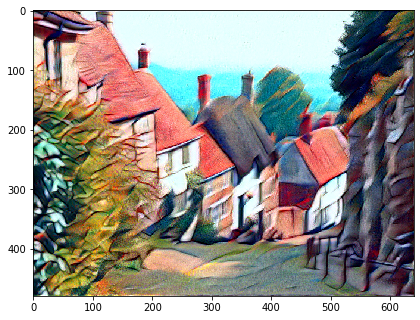

....................................................................................................Step 600


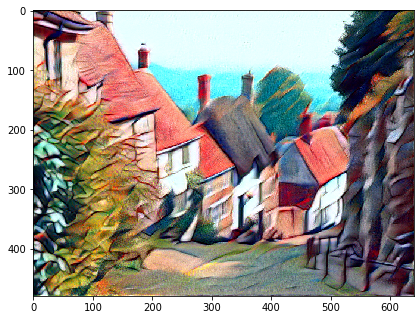

....................................................................................................Step 700


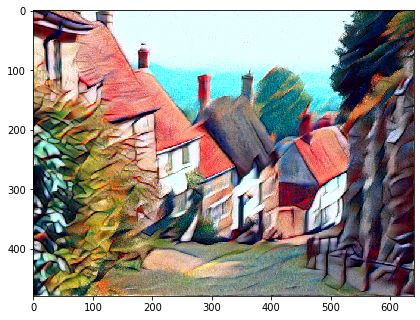

....................................................................................................Step 800


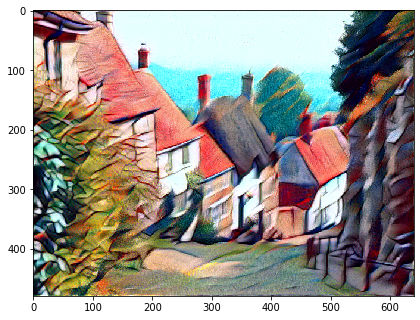

....................................................................................................Step 900


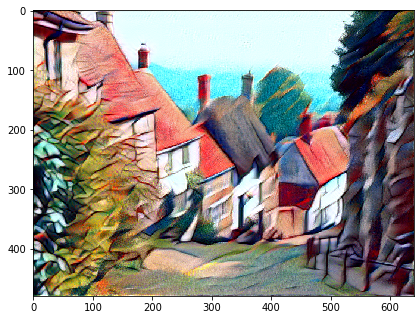

....................................................................................................Step 1000


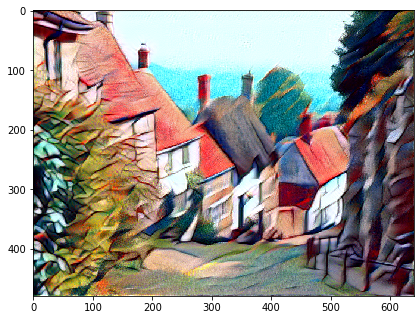

.Total time: 228.4


In [0]:
tf.random.set_seed(0)
import time
start = time.time()
tf.random.set_seed(0)
import time
start = time.time()
loss_ls = [[], [],[],[]]

total_steps = 1000
#initialize with content image
image = tf.Variable(content_image)

for i in range(1, total_steps+1):
  if i == 50 or i % 100 == 0:
    print("Step " + str(i))
    plt.subplot(1, 2, 1)
    imshow(tf.squeeze(image, axis=0))
    plt.show()
  print(".", end='')
  loss_result = gradient_descent_two_styles(image)
  for i in range(4):
    loss_ls[i].append(loss_result[i].numpy())

end = time.time()
print("Total time: {:.1f}".format(end-start))

#Code Reference

1.Tutorial from Tensorflow: https://www.tensorflow.org/tutorials/generative/style_transfer